# Project: Fruit freshness detector

In [7]:
import torch, torchvision, matplotlib.pyplot as plt, sklearn, tqdm.notebook as tqdm, time
from sklearn.exceptions import ConvergenceWarning
import warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)
import itertools
from torchmetrics.classification import MulticlassF1Score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

import pandas as pd
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score
import torch.optim as optim
import torch
import torch.nn as nn
import torch.utils.data
from IPython.display import clear_output
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image
import shutil
import random

### Steps to Load and Prepare the Dataset

- Resize All Images to a Standard Size: This will ensure that all images are compatible with the model input dimensions. A standard size (e.g., 224x224 pixels) is common for convolutional neural networks.
- Split Data into Training, Validation, and Test Sets: It’s a good practice to do this upfront to ensure consistent evaluation and avoid data leakage.

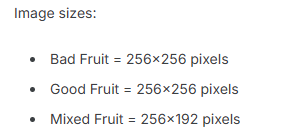


In [8]:
# Define the path to your data directory
data_dir = r"C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data" #to general data
# Paths for your data

YOLO_dataset = r'C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\YOLO_dataset'  # Directory to store YOLO-formatted dataset


In [10]:
from PIL import Image
import os

def resize_images(base_dir, target_size=(224, 224)):
    """
    Resize all images in the given directory (and its subdirectories) to the target size.
    
    Parameters:
    - base_dir (str): Path to the base directory containing images.
    - target_size (tuple): Desired image size (width, height).
    """
    for folder_name in os.listdir(base_dir):
        folder_path = os.path.join(base_dir, folder_name)
        if os.path.isdir(folder_path):  # Ensure it's a folder
            for img_name in os.listdir(folder_path):
                img_path = os.path.join(folder_path, img_name)
                try:
                    # Open the image
                    with Image.open(img_path) as img:
                        # Check if the image size matches the target size
                        if img.size != target_size:
                            # Resize and save the image
                            img_resized = img.resize(target_size)
                            img_resized.save(img_path)  # Overwrite the original file
                            print(f"Resized {img_name} in folder {folder_name} to {target_size}")
                except Exception as e:
                    print(f"Error resizing {img_name} in folder {folder_name}: {e}")


# Resize all images in the dataset to the target size
resize_images(data_dir, target_size=(224, 224))


Resized IMG20200728175856.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175907.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175908.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175909.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175910.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175912.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175913.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175917.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175919.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175922.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175926.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175927.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175936.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175940.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175946.jpg in folder Apple_Bad to (224, 224)
Resized IMG20200728175949.jpg in folder 

In [11]:
import os
from PIL import Image

def verify_image_sizes(base_dir, expected_size=(224, 224)):
    """
    Verify that all images in a directory have the expected size.

    Args:
        base_dir (str): Path to the base directory containing image subfolders.
        expected_size (tuple): Expected size of the images (width, height).

    Returns:
        None: Prints out mismatched images and their sizes.
    """
    incorrect_sizes = []  # To store images with incorrect sizes

    # Loop through each subfolder
    for folder_name in os.listdir(base_dir):
        folder_path = os.path.join(base_dir, folder_name)
        if os.path.isdir(folder_path):  # Ensure it's a folder
            # Loop through each file in the folder
            for img_name in os.listdir(folder_path):
                img_path = os.path.join(folder_path, img_name)
                try:
                    with Image.open(img_path) as img:
                        # Check if image size matches the expected size
                        if img.size != expected_size:
                            incorrect_sizes.append((folder_name, img_name, img.size))
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")

    # Report results
    if incorrect_sizes:
        print("Images with incorrect sizes:")
        for folder, img_name, size in incorrect_sizes:
            print(f"Image '{img_name}' in folder '{folder}' has size {size}, expected {expected_size}")
    else:
        print(f"All images have the correct size: {expected_size}")

# Define the path to your dataset and the expected size
expected_size = (224, 224)

# Verify image sizes
verify_image_sizes(data_dir, expected_size)


All images have the correct size: (224, 224)


### Labeling data
 leveraging an existing object detection model to generate initial bounding boxes is a smart choice, especially given the size of your dataset and the time-saving benefits. Using a pretrained model, like YOLOv5, allows you to automatically create bounding boxes around the fruits, which you can then refine as needed. This approach, often called semi-automatic labeling, can drastically reduce the manual effort required to label thousands of images.

Step 1: Clone the YOLOv5 Repository and Install Dependencies
You can run the following commands directly in a Jupyter notebook cell by prefixing each command with !.

In [11]:
# Clone the YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
# Change directory to YOLOv5
%cd yolov5
# Install required dependencies
!pip install -r requirements.txt


c:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\yolov5


fatal: destination path 'yolov5' already exists and is not an empty directory.
C:\Users\cheng\AppData\Roaming\Python\Python39\site-packages\IPython\core\magics\osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Step 2: Verify the Installation
Run the following to verify that YOLOv5 was set up correctly and can be imported as a module in the notebook.



In [ ]:
import os
import random
import shutil
from PIL import Image
import torch

def split_and_generate_bounding_boxes(base_dir, output_dir, split_ratios=(0.7, 0.2, 0.1), model_name='yolov5s', conf_threshold=0.25):
    """
    Splits the dataset into train, val, and test sets and generates bounding boxes for YOLOv5.

    Args:
        base_dir (str): Path to the base directory containing class folders with images.
        output_dir (str): Directory to save the split dataset and bounding boxes.
        split_ratios (tuple): Ratios for train, validation, and test splits.
        model_name (str): Pretrained YOLOv5 model to use for bounding box generation.
        conf_threshold (float): Confidence threshold for filtering predictions.

    Returns:
        None
    """
    # Load the pretrained YOLOv5 model
    model = torch.hub.load('ultralytics/yolov5', model_name, pretrained=True)

    # Ensure random shuffling is reproducible
    random.seed(42)

    # Create output directories for splits
    for split in ['train', 'val', 'test']:
        for subdir in ['images', 'labels']:
            os.makedirs(os.path.join(output_dir, split, subdir), exist_ok=True)

    # Loop through each class folder
    for class_folder in os.listdir(base_dir):
        class_path = os.path.join(base_dir, class_folder)
        
        if os.path.isdir(class_path):  # Ensure it's a directory
            print(f"Processing class folder: {class_folder}")

            # Collect all images in the class folder
            images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.png'))]
            random.shuffle(images)

            # Compute split indices
            train_end = int(len(images) * split_ratios[0])
            val_end = train_end + int(len(images) * split_ratios[1])

            # Assign images to splits
            splits = {
                'train': images[:train_end],
                'val': images[train_end:val_end],
                'test': images[val_end:]
            }

            # Process each split
            for split, split_images in splits.items():
                for img_name in split_images:
                    # Copy image
                    img_src = os.path.join(class_path, img_name)
                    img_dst = os.path.join(output_dir, split, 'images', img_name)
                    shutil.copy(img_src, img_dst)

                    # Generate bounding boxes and save in YOLO format
                    img = Image.open(img_src)
                    width, height = img.size  # Get image dimensions

                    # Run inference on the image
                    results = model(img, size=224)
                    detections = results.xywh[0]  # xywh format: (x_center, y_center, width, height, confidence, class)

                    # Filter predictions by confidence threshold
                    filtered_detections = detections[detections[:, 4] > conf_threshold]

                    # Write bounding boxes to a YOLO format label file
                    label_name = os.path.splitext(img_name)[0] + ".txt"
                    label_dst = os.path.join(output_dir, split, 'labels', label_name)

                    with open(label_dst, 'w') as label_file:
                        for detection in filtered_detections:
                            x_center, y_center, bbox_width, bbox_height, confidence, class_id = detection.tolist()

                            # Normalize bounding box coordinates to [0, 1]
                            x_center /= width
                            y_center /= height
                            bbox_width /= width
                            bbox_height /= height

                            # Write in YOLO format: class_id x_center y_center width height
                            label_file.write(f"{int(class_id)} {x_center:.6f} {y_center:.6f} {bbox_width:.6f} {bbox_height:.6f}\n")

                    print(f"Processed: {img_name} -> {split}/{label_name}")

    print(f"Dataset split and bounding box generation completed. Data saved in {output_dir}")


# Split the dataset and generate bounding boxes
split_and_generate_bounding_boxes(data_dir, YOLO_dataset)



In [12]:
!python train.py --img 224 --batch 16 --epochs 10 --data C:/Users/cheng/Documents/VSC/Higher_level_CV/Examination_project/YOLO_dataset/YOLO_data.yaml --weights yolov5s.pt --cache


train: weights=yolov5s.pt, cfg=, data=C:/Users/cheng/Documents/VSC/Higher_level_CV/Examination_project/YOLO_dataset/YOLO_data.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-383-g1435a8ee Python-3.9.10 torch-2.5.0+cpu CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warm

In [ ]:
!python val.py --data data.yaml --weights runs/train/exp/weights/best.pt --img 224


Step 6: Visualize YOLO’s Bounding Boxes (Optional) testing
To confirm visually that the bounding boxes make sense, you can display some images with the bounding boxes overlayed. Here’s how you can visualize them:

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Apple_Bad\IMG20200728175856.jpg
Bounding box for class 0: (0, 79), (140, 254)
Bounding box for class 0: (19, 78), (134, 191)
Bounding box for class 0: (55, 195), (107, 255)


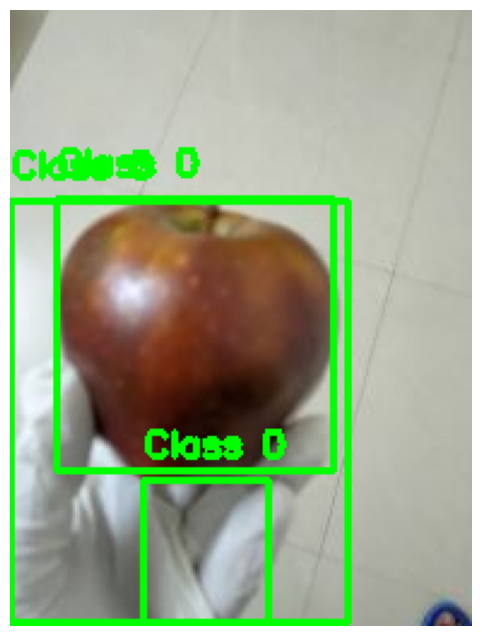

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Apple_Good\20190809_115439.jpg
Bounding box for class 1: (62, 38), (198, 181)


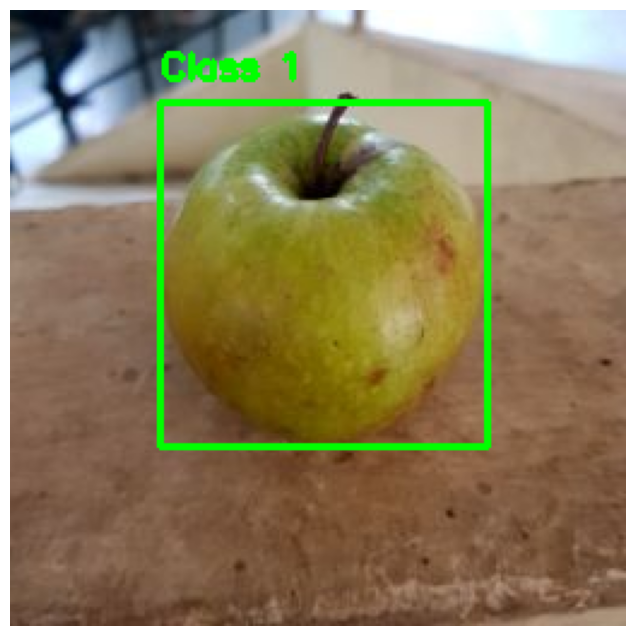

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Banana_Bad\IMG20200729190307.jpg
Bounding box for class 2: (105, 14), (195, 119)
Bounding box for class 2: (54, 18), (118, 132)


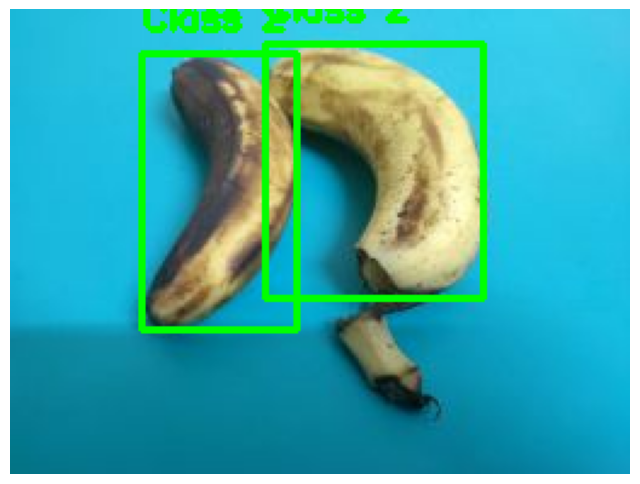

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Banana_Good\IMG20200729190220.jpg
Bounding box for class 3: (52, 31), (135, 186)
Bounding box for class 3: (76, 33), (194, 189)
Bounding box for class 3: (145, 37), (219, 191)


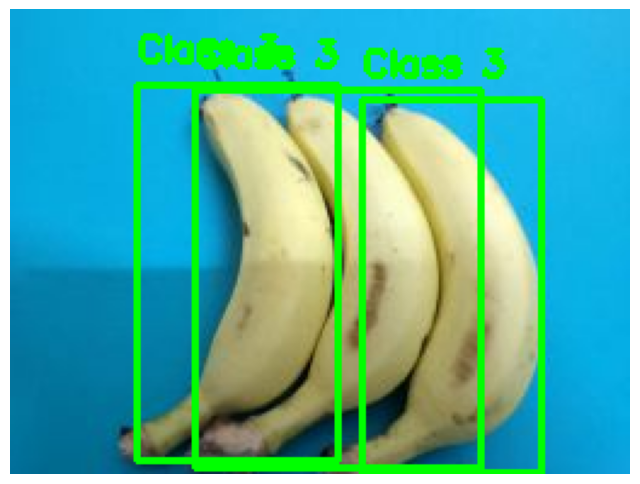

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Guava_Bad\IMG20200728184715.jpg


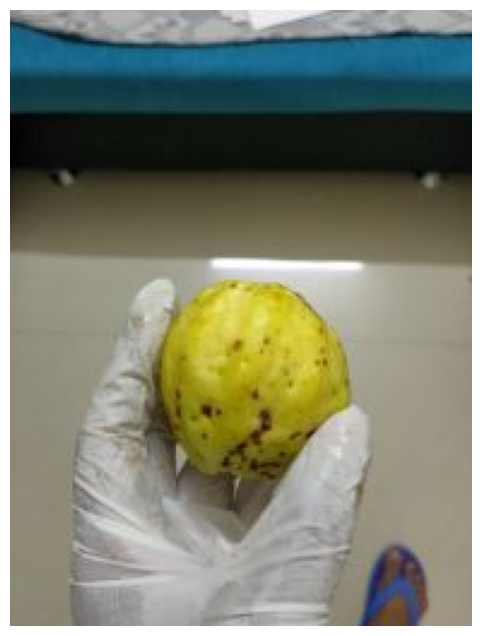

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Guava_Good\20190813_121038.jpg
Bounding box for class 5: (95, 90), (248, 220)


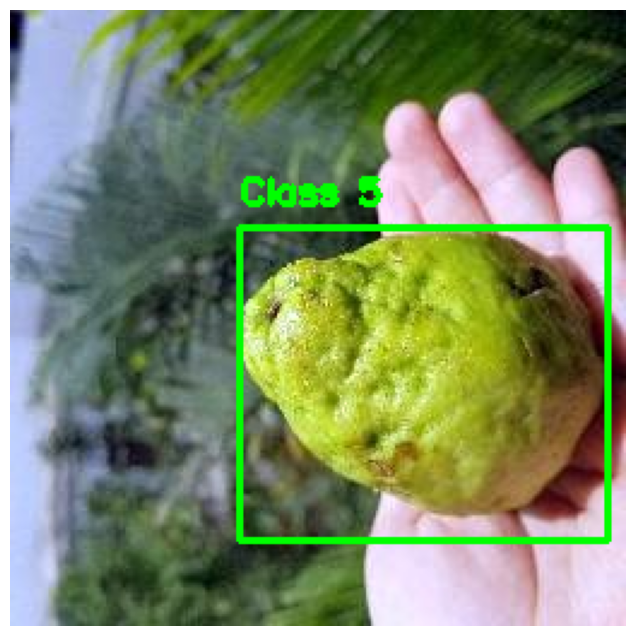

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Lime_Bad\IMG20200728190805_01.jpg
Bounding box for class 6: (72, 133), (129, 189)


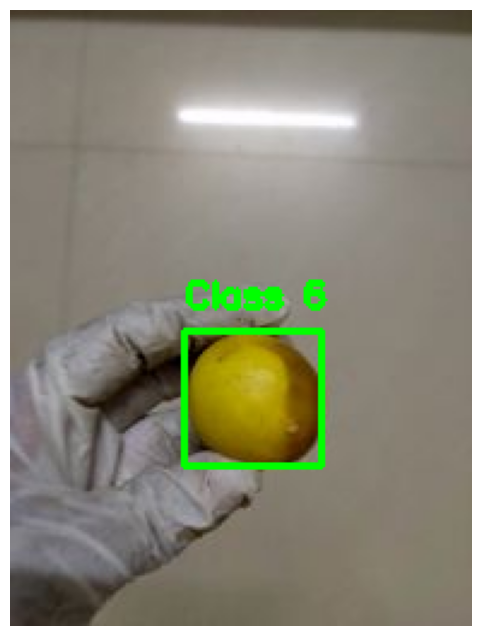

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Lime_Good\IMG20200728131548.jpg
Bounding box for class 7: (64, 80), (92, 106)
Bounding box for class 7: (144, 104), (169, 129)
Bounding box for class 7: (149, 71), (176, 99)
Bounding box for class 7: (106, 65), (130, 88)
Bounding box for class 7: (109, 31), (130, 52)
Bounding box for class 7: (127, 53), (150, 75)
Bounding box for class 7: (147, 38), (171, 63)


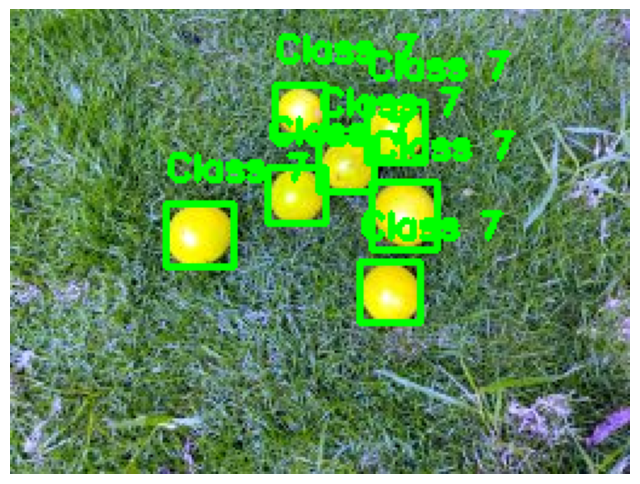

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Orange_Bad\IMG20200728140705.jpg
Bounding box for class 8: (94, 169), (168, 251)
Bounding box for class 8: (27, 129), (92, 194)
Bounding box for class 8: (92, 104), (155, 169)
Bounding box for class 8: (61, 35), (128, 107)
Bounding box for class 8: (1, 56), (67, 128)
Bounding box for class 8: (0, 56), (67, 127)
Bounding box for class 8: (63, 35), (129, 107)


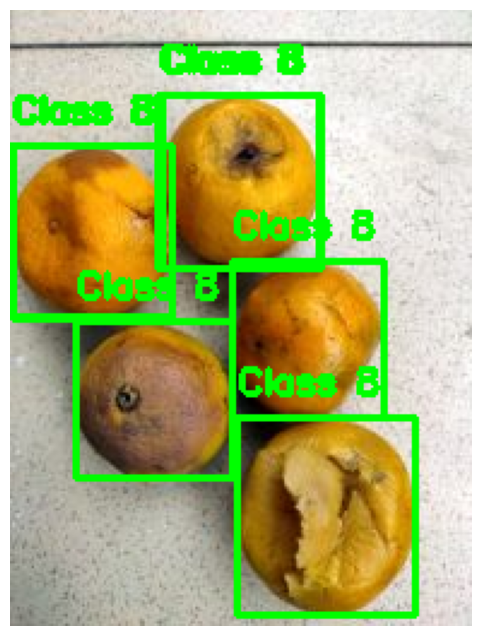

Displaying bounding boxes for: C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed\Orange_Good\IMG20200728130753.jpg
Bounding box for class 9: (102, 95), (150, 139)
Bounding box for class 9: (58, 77), (100, 118)
Bounding box for class 9: (143, 79), (182, 118)
Bounding box for class 9: (175, 73), (203, 97)
Bounding box for class 9: (126, 66), (154, 92)
Bounding box for class 9: (94, 70), (124, 95)


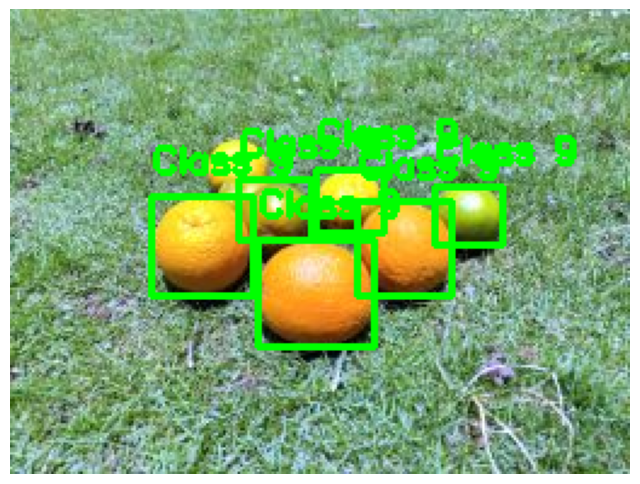

In [20]:
import os
import cv2
import matplotlib.pyplot as plt

%matplotlib inline

def plot_image_with_bboxes(image_path, label_path):
    # Load image
    img = cv2.imread(image_path)
    height, width = img.shape[:2]
    
    # Read the label file and draw bounding boxes
    with open(label_path, "r") as f:
        for line in f:
            values = line.strip().split()
            if len(values) != 5:
                print(f"Unexpected label format in {label_path}: {line}")
                continue
            
            class_id, x_center, y_center, w, h = map(float, values)
            
            # Convert normalized coordinates to absolute values
            x_center, y_center = int(x_center * width), int(y_center * height)
            w, h = int(w * width), int(h * height)
            x1, y1 = int(x_center - w / 2), int(y_center - h / 2)
            x2, y2 = int(x_center + w / 2), int(y_center + h / 2)
            
            # Print bounding box coordinates for verification
            print(f"Bounding box for class {int(class_id)}: ({x1}, {y1}), ({x2}, {y2})")
            
            # Draw bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, f"Class {int(class_id)}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Display image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    plt.close()

# Main directories
image_base_dir = r'C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed'  # Folder with images in subfolders
label_base_dir = r'C:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project\data_without_mixed_labeled'  # Folder with labels in subfolders

# Set the maximum number of images to display
max_images = 10
counter = 0

# Loop through each subfolder and display a sample image with bounding boxes
for subfolder in os.listdir(image_base_dir):
    # Skip "mixed" folders
    if "mixed" in subfolder.lower():
        print(f"Skipping mixed folder: {subfolder}")
        continue

    image_dir = os.path.join(image_base_dir, subfolder)
    label_dir = os.path.join(label_base_dir, subfolder)
    
    if os.path.isdir(image_dir) and os.path.isdir(label_dir):
        # List all images in the subfolder
        image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]
        
        # Check if there are any images in the subfolder
        if image_files:
            # Display a sample image with bounding boxes
            sample_image_path = os.path.join(image_dir, image_files[0])
            sample_label_path = os.path.join(label_dir, os.path.splitext(image_files[0])[0] + ".txt")
            print(f"Displaying bounding boxes for: {sample_image_path}")
            plot_image_with_bboxes(sample_image_path, sample_label_path)
            
            counter += 1
            if counter >= max_images:
                break
    else:
        print(f"Skipping {subfolder} as it doesn't have both images and labels.")



Found 13660 images belonging to 18 classes.


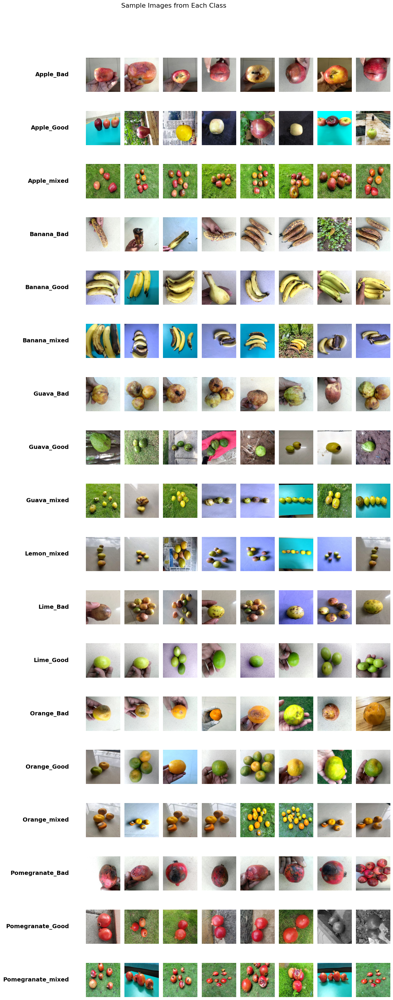

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define path to the training directory
train_dir = r"split_data/train"  # Update this path as needed

# Initialize ImageDataGenerator for loading the data
datagen = ImageDataGenerator(rescale=1.0/255)

# Load data in batches from directory
train_data = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

# Get the class labels
class_labels = list(train_data.class_indices.keys())

# Number of classes and images to show per class
num_classes = len(class_labels)
num_images_per_class = 8

# Set up the plot grid with extra space for labels
fig, ax = plt.subplots(num_classes, num_images_per_class, figsize=(15, num_classes * 2))
fig.suptitle("Sample Images from Each Class", fontsize=16)

# Initialize a dictionary to store images for each class
images_per_class = {label: [] for label in class_labels}

# Collect images until we have the desired amount per class
while any(len(images) < num_images_per_class for images in images_per_class.values()):
    # Load a batch of images and labels
    X_batch, y_batch = next(train_data)

    # For each class, add images until reaching the desired number
    for i, label in enumerate(class_labels):
        class_indices = np.where(y_batch[:, i] == 1)[0]
        needed_images = num_images_per_class - len(images_per_class[label])

        # Add images to the class if more are needed
        for idx in class_indices[:needed_images]:
            images_per_class[label].append(X_batch[idx])

# Plot images with clear labels
for i, label in enumerate(class_labels):
    for j in range(num_images_per_class):
        ax[i, j].imshow(images_per_class[label][j])
        ax[i, j].axis('off')
    
    # Add the class label on the left side of each row
    ax[i, 0].text(-0.5, 0.5, label, rotation=0, ha='right', va='center', 
                  transform=ax[i, 0].transAxes, fontsize=14, fontweight='bold')

plt.tight_layout(rect=[0.1, 0.03, 1, 0.95])  # Adjust layout for label space
plt.show()


